# Análisis Exploratorio y Curación de Datos

**Todo ejercicio debe tener un análisis fundamentado en la teoría vista en la materia, dicho análisis sera parte del informe a entregar en pdf**

El *dataset* contiene las siguientes columnas:

- **rac y dec** = Posición angular, rac de 0 a 360 y dec de -90 a 90
- **Mag_u,Mag_g,Mag_r,Mag_i,Mag_z**= Estas variables representan una fracción de la luz total que observamos de las galaxias según su frecuencia (como por ejemplo, la frecuencia de radio, para más información [wiki](https://es.wikipedia.org/wiki/Espectro_visible))
- **z** = Es una medida de la distancia a la que se encuentra la galaxia
- **R** = Es una medida del tamaño de la galaxia
- **color**= Como su nombre lo indica es el color más predominante en la galaxia
- **elíptica, espiral, irregular**= Estas columnas identifican el tipo de morfología de las galaxias. Si el valor de una de estas tres columnas es 1, entonces la galaxia tiene esa morfología y las dos restantes tendran el valor 0. 

# Paquetes necesarios 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
 
%matplotlib inline

In [2]:
plt.rcParams['figure.figsize'] = (10.0, 8.0)


# Carga de datos

Carga el conjunto de datos 'galaxias_1.csv' como un DataFrame 

- Definir el id como index del DataFrame
- Mostrar el tipo de dato de cada columna 
- Observar si hay filas e indices duplicados
- Realicen algunas exploraciones más sobre el dataset
- Estudiar y solucionar los outliers o valores faltantes 

In [3]:
data = pd.read_csv("dataset/galaxias_1.csv")
data.head()

,objID,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
0,"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0
1,"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1
2,"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1
3,"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1
4,"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1


In [4]:
data.describe()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
count,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000,92102.000000
mean,181.086338,24.723737,184.319135,171.045909,160.125000,163.614406,139.806936,57.032318,0.036092,-3.462711,0.089651,0.326225,0.584124
std,61.177151,18.853785,1737.511731,1612.598539,1525.504087,1530.181510,1402.492646,923.367743,0.008435,76.781199,0.285682,0.468833,0.492875
min,0.008745,-11.202394,-9999.000000,-9999.000000,11.524090,11.220580,-9999.000000,0.842248,0.020001,-2902.000000,0.000000,0.000000,0.000000
25%,150.287271,9.115292,17.733585,16.260870,15.572525,15.210220,14.919152,6.120165,0.029082,-2.511168,0.000000,0.000000,0.000000
50%,183.219954,23.111344,18.453880,17.094630,16.506160,16.188085,15.947850,8.365595,0.036321,-1.995331,0.000000,0.000000,1.000000
75%,222.722975,38.982500,19.047078,17.734885,17.227810,16.947265,16.753538,11.368645,0.043620,-1.607067,0.000000,1.000000,1.000000
max,359.965567,70.133213,25756.000000,20542.000000,19138.000000,23871.000000,20823.000000,78255.000000,0.050000,10015.860000,1.000000,1.000000,1.000000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92102 entries, 0 to 92101
Data columns (total 14 columns):
objID         92102 non-null object
ra            92102 non-null float64
dec           92102 non-null float64
modelMag_u    92102 non-null float64
modelMag_g    92102 non-null float64
modelMag_r    92102 non-null float64
modelMag_i    92102 non-null float64
modelMag_z    92102 non-null float64
petroR90_r    92102 non-null float64
z             92102 non-null float64
Color         92102 non-null float64
elliptical    92102 non-null int64
spiral        92102 non-null int64
uncertain     92102 non-null int64
dtypes: float64(10), int64(3), object(1)
memory usage: 9.8+ MB


Seteo "objID" como index

In [6]:
data.set_index("objID", inplace=True)

In [7]:
data.head()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
objID,,,,,,,,,,,,,
"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0
"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1
"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1
"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1
"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1


Veo que tipos de datos tengo

In [8]:
data.dtypes

ra            float64
dec           float64
modelMag_u    float64
modelMag_g    float64
modelMag_r    float64
modelMag_i    float64
modelMag_z    float64
petroR90_r    float64
z             float64
Color         float64
elliptical      int64
spiral          int64
uncertain       int64
dtype: object

## Veo si tengo valores duplicados

In [9]:
data[data.astype(str).duplicated()].shape

(61, 13)

In [10]:
data[data.index.astype(str).duplicated()].shape[0] / data.shape[0]

0.37372695489783064

In [11]:
data[data.index.astype(str).duplicated()].shape[0]

34421

Veo que hay muchos indices repetidos, pero no así tantas filas completas.
Una explicación posible a esto es que las galaxias estan identificadas por el indice, pero hay observacion de una misma galaxia en diferentes momentos temporales, por lo que no esta mal tener indices repetidos.

Sin embargo, para nuestro estudio, no nos interesan los cambios o variaciones en una galaxia puntual, sino cada galaxia en particual. Por lo tanto vamos a eliminar los ObjID repetidos

### Saco los duplicados

In [12]:
data.shape

(92102, 13)

In [13]:
#data_cl = data.loc[~(data.astype(str).duplicated(keep="first"))]
data_cl = data.loc[~(data.index.astype(str).duplicated(keep="first"))]

In [14]:
data_cl.shape

(57681, 13)

In [15]:
data_cl.head()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain
objID,,,,,,,,,,,,,
"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0
"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1
"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1
"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1
"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1


Hago un poco más de exploración en el data set

In [16]:
def galaxy_morf(row):
    if row["elliptical"]:
        return "E"
    elif row["spiral"]:
        return "S"
    else:
        return "I"

In [17]:
data_cl["type"] = data_cl.apply(galaxy_morf, axis=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


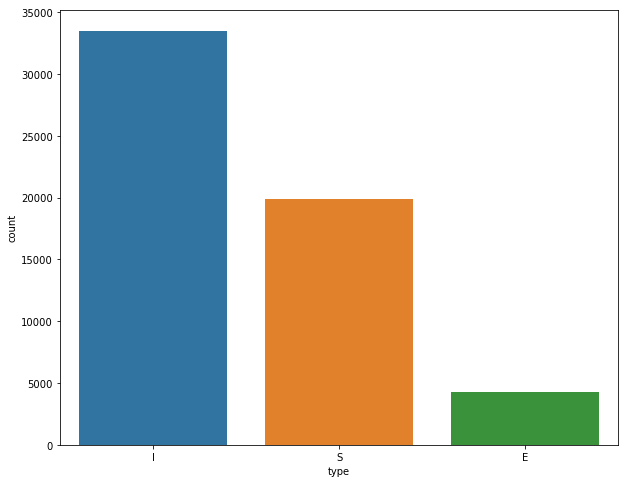

In [18]:
sns.countplot(data_cl["type"], order=["I", "S", "E"])

## Veo valores faltantes

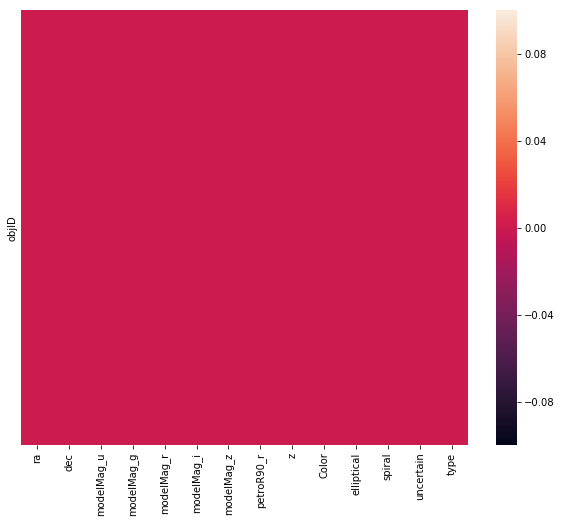

In [19]:
sns.heatmap(data_cl.isna(), yticklabels=False)

No tengo valores NaN. Pero puede que tenga valores que fisicamente no tienen sentido

## Distribucion de datos

In [20]:
def distribution_per_type(df, col_name="", bins=20):
    plt.title(f"{col_name.capitalize()} Distribution")
    sns.distplot(df[df["elliptical"] == 1][col_name],label="elliptical", bins=bins)
    sns.distplot(df[df["spiral"] == 1][col_name],label="spiral", bins=bins)
    sns.distplot(df[df["uncertain"] == 1][col_name],label="irregular", bins=bins)
    plt.legend()
    
def exploratory_plots(df, col_name=""):
    plt.subplot(3, 1, 1)
    distribution_per_type(df, col_name)
    plt.subplot(3, 1, 2)
    plt.title(f"{col_name.capitalize()} Boxplot")
    sns.boxplot(x="type", y=col_name, data=df)

    plt.subplot(3, 1, 3)
    plt.title(f"{col_name.capitalize()} Boxplot w/o Outliers")
    sns.boxplot(x="type", y=col_name, data=df, showfliers=False)
    
    plt.tight_layout()

### Z (red shift)

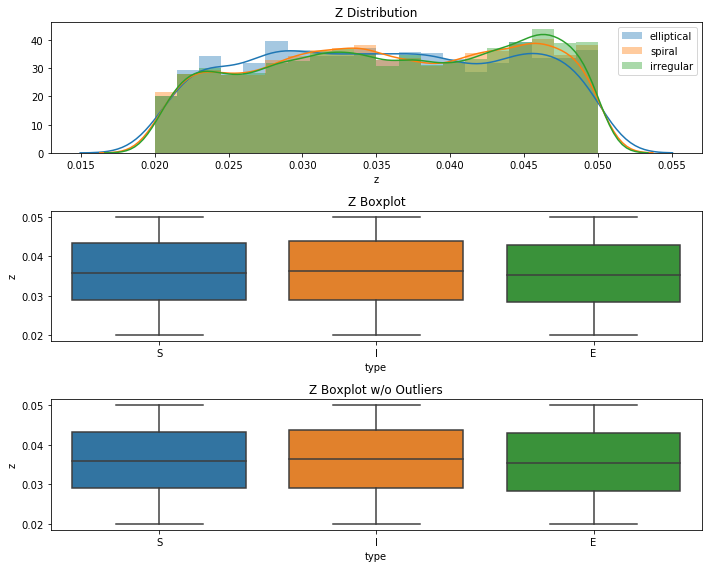

In [21]:
exploratory_plots(data_cl, "z")

_____________________
La columna "z", tiene una ditribcuion uniforme y no parece tener outliers
_____________________

### Color

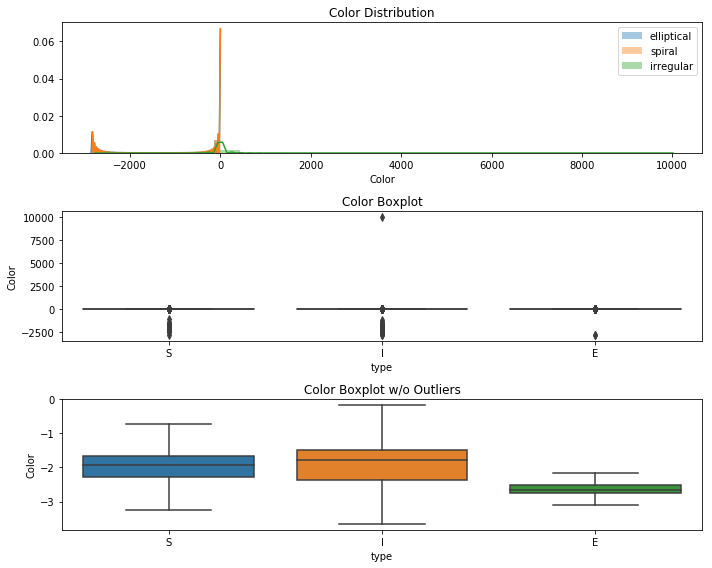

In [22]:
exploratory_plots(data_cl, "Color")

Vemos que hay valores muy extremos, mientras que gran parte de la distribucion esta en valores alrededor de 0

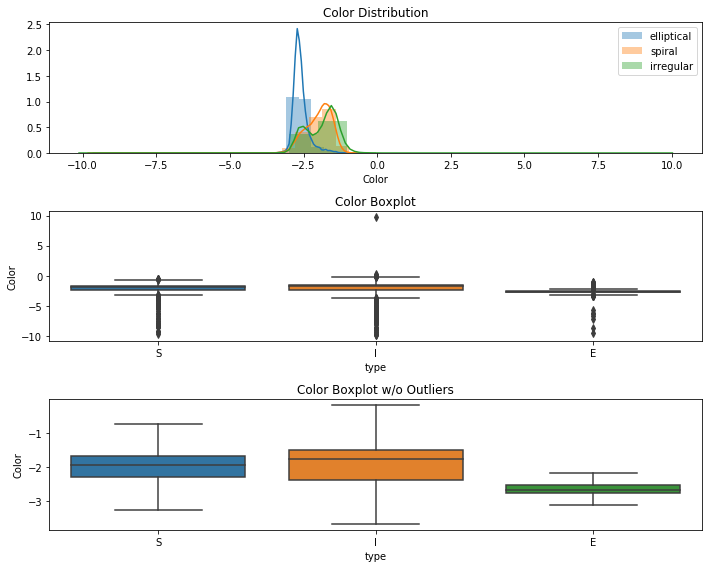

In [23]:
mask_color = (data_cl["Color"] < 10) & (data_cl["Color"]>-10)
exploratory_plots(data_cl[mask_color], "Color")


Podemos decir que los datos de color que tienen sentido deben estar entre 0 y -5

In [24]:
mask_color = (data_cl["Color"] < 0) & (data_cl["Color"]>-5)
data_cl_color = data_cl[mask_color]

In [25]:
print(data_cl.shape)
print(data_cl_color.shape)

(57681, 14)
(57506, 14)


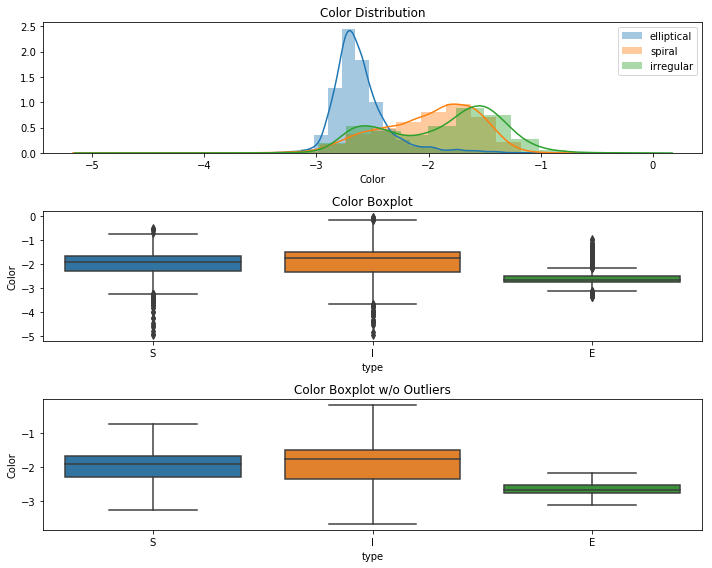

In [26]:
exploratory_plots(data_cl_color, "Color")

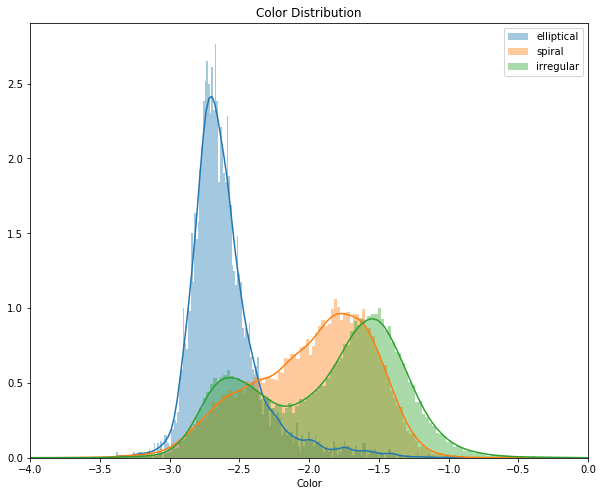

In [27]:
distribution_per_type(data_cl_color, col_name="Color", bins=200)
_ = plt.xlim([-4, 0])

### petroR90_r

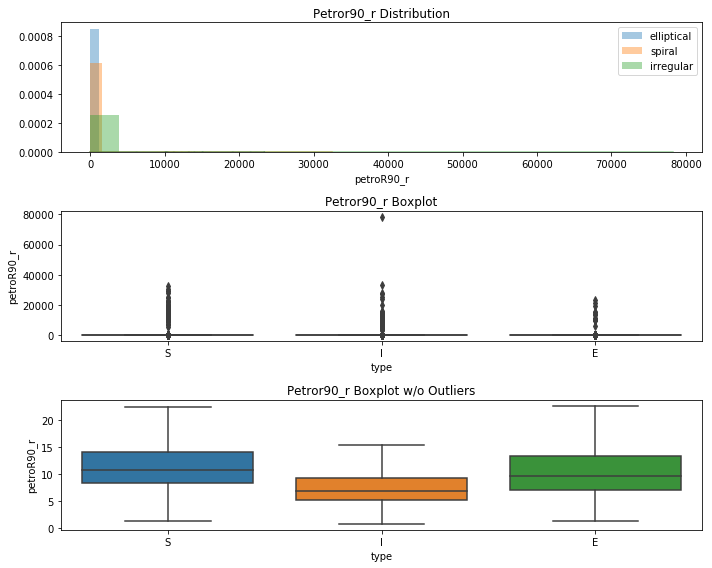

In [28]:
exploratory_plots(data_cl, "petroR90_r")

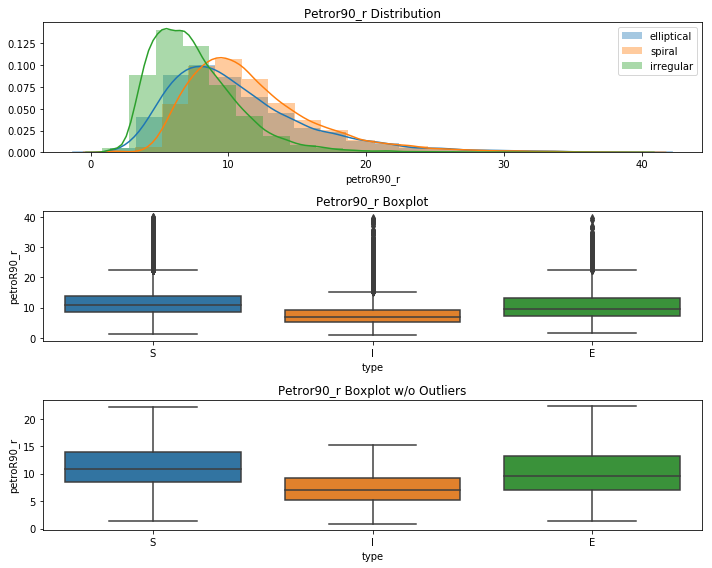

In [29]:
mask_petro = data_cl["petroR90_r"]<40
data_cl_petro = data_cl[mask_petro]
exploratory_plots(data_cl_petro, "petroR90_r")

In [30]:
data_cl_petro = data_cl[data_cl["petroR90_r"]<40]

In [31]:
print(data_cl.shape)
print(data_cl_petro.shape)

(57681, 14)
(57428, 14)


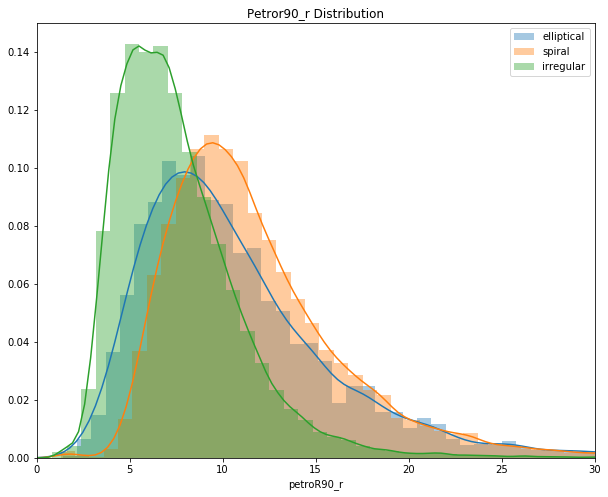

In [32]:
distribution_per_type(data_cl_petro, col_name="petroR90_r", bins=50)
_ = plt.xlim([0, 30])


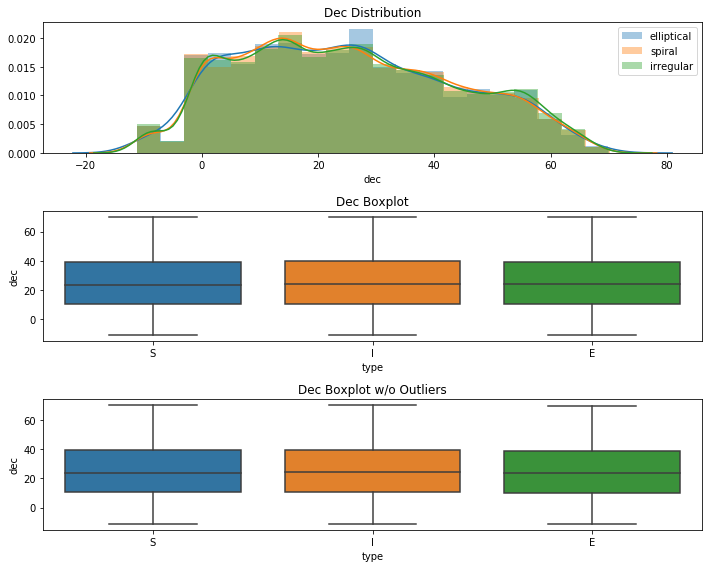

In [33]:
exploratory_plots(data_cl, "dec")

### Ra

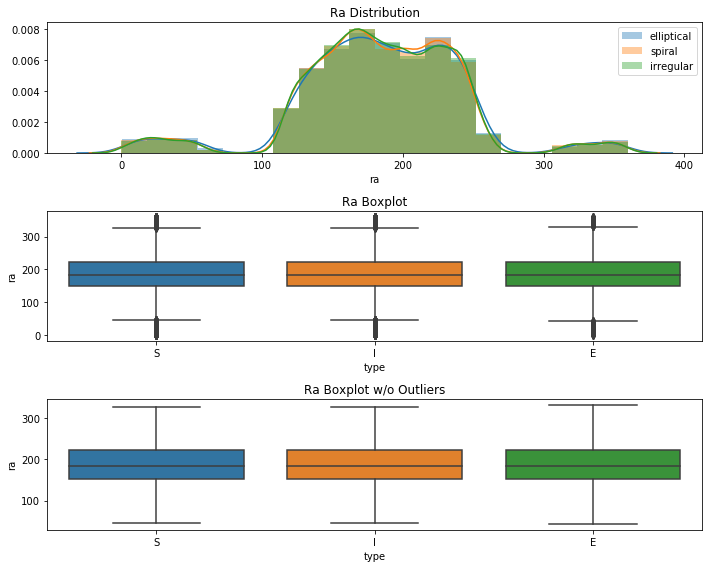

In [34]:
exploratory_plots(data_cl, "ra")

### Mag Distributions

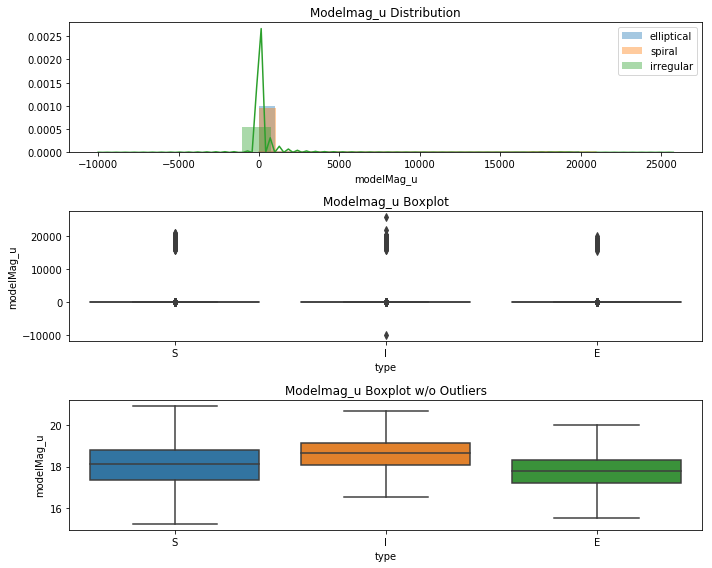

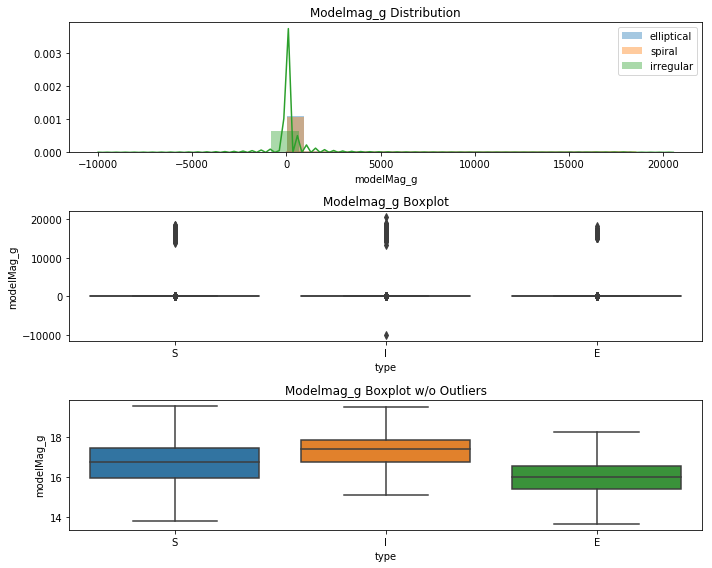

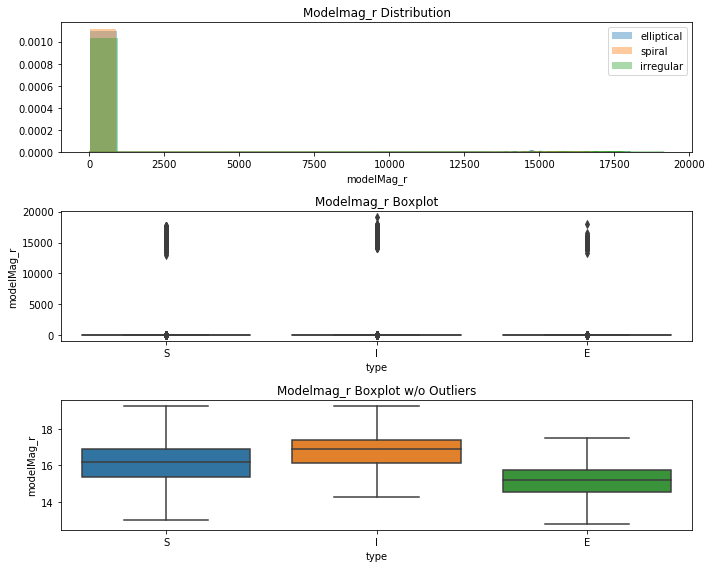

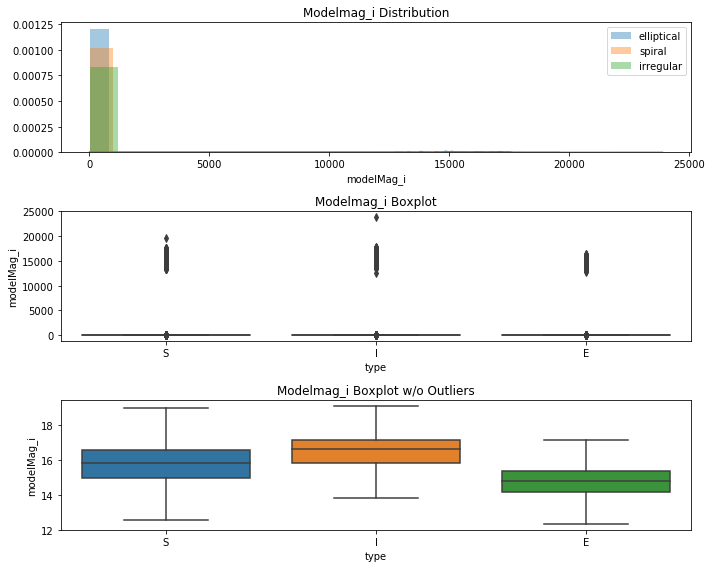

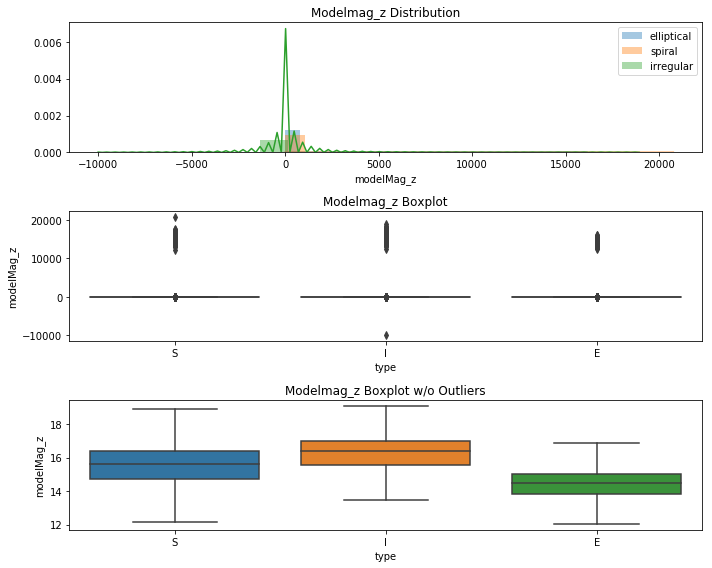

In [35]:
for mag in ['modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i','modelMag_z']:
    plt.figure()
    exploratory_plots(data_cl, mag)

In [36]:
mask_mag = ((abs(data_cl["modelMag_u"]) < 30) & 
    (abs(data_cl["modelMag_g"] < 30)) & 
    (abs(data_cl["modelMag_r"] < 30)) & 
    (abs(data_cl["modelMag_i"] < 30)) & 
    (abs(data_cl["modelMag_z"] < 30))) 
data_cl_mag = data_cl[mask_mag]
data_cl_mag.shape

(55164, 14)

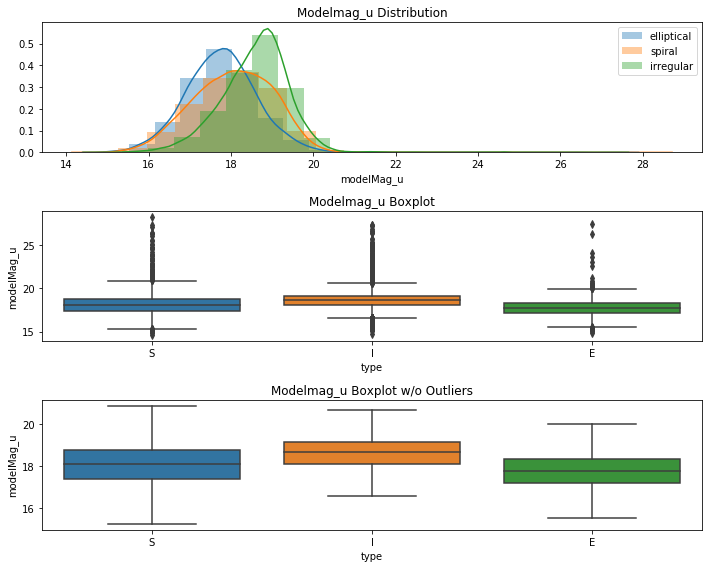

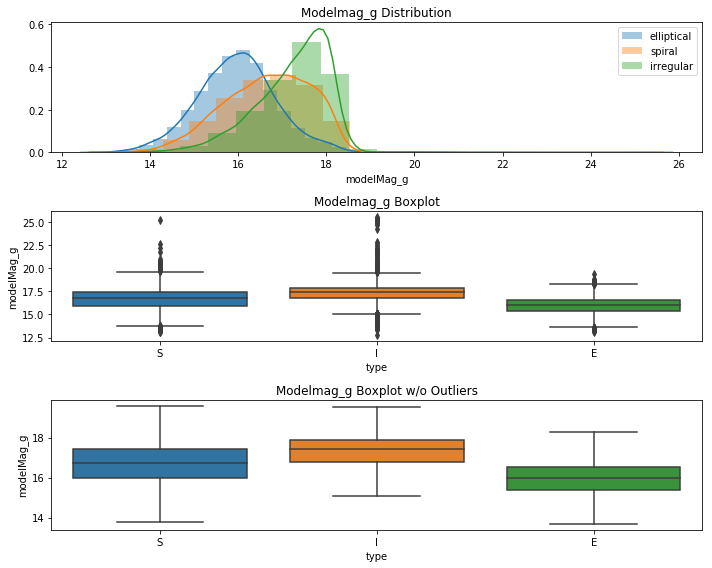

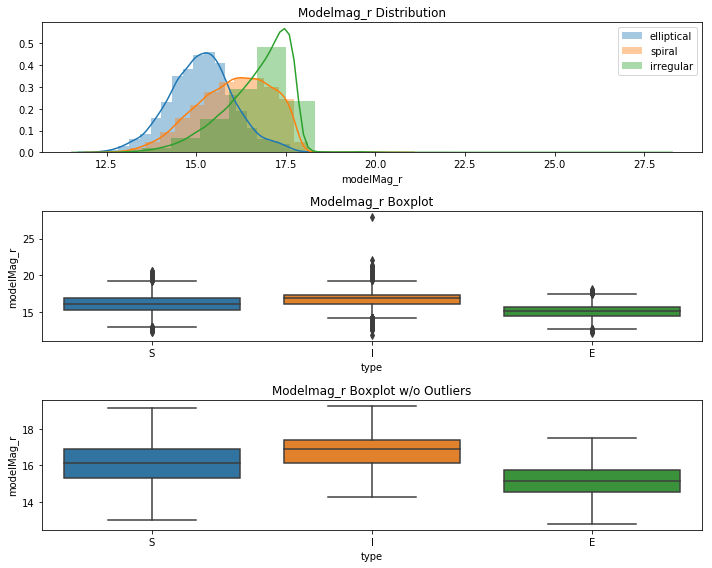

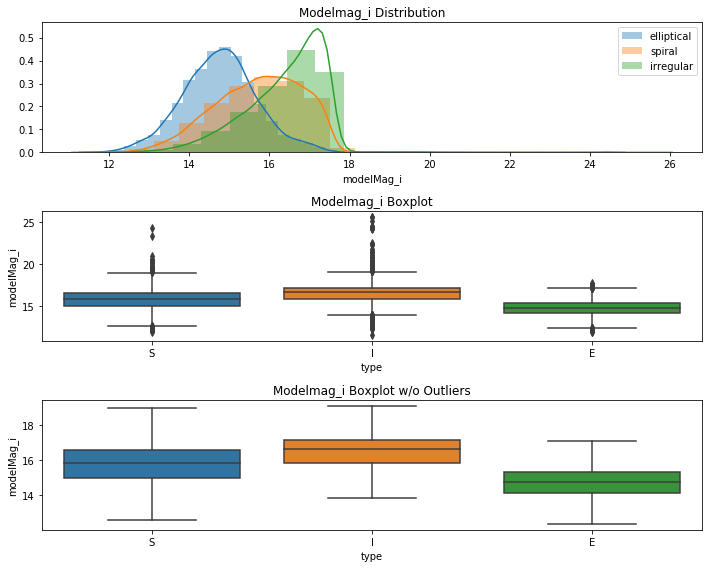

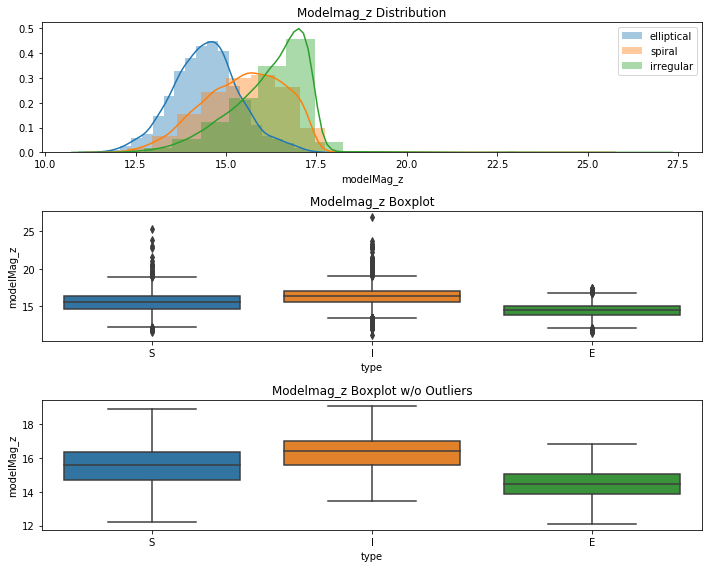

In [37]:
for mag in ['modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i','modelMag_z']:
    plt.figure()
    exploratory_plots(data_cl_mag, mag)

In [38]:
mask_no_outl = mask_color & mask_petro & mask_mag
data_cl_no_outl = data_cl[mask_no_outl]
print(data_cl.shape)
print(data_cl_no_outl.shape)
print(data_cl_no_outl.shape[0]/data_cl.shape[0]*100)

(57681, 14)
(54764, 14)
94.94287547025884


Sacando los outliers, solo estoy descartando ~5000 de un total de ~57000. Aun no tengo el 95% de los datos. Por lo tanto acepto el descarte de esots datos

In [39]:
data_cl_no_outl.head()

,ra,dec,modelMag_u,modelMag_g,modelMag_r,modelMag_i,modelMag_z,petroR90_r,z,Color,elliptical,spiral,uncertain,type
objID,,,,,,,,,,,,,,
"1,23765119242489E+018",116.519097,39.886407,17.76235,16.72601,16.33972,16.06614,15.90478,8.393773,0.041521,-1.422625,0,1,0,S
"1,23765149575578E+018",116.451900,41.421270,18.12179,16.26214,15.39272,14.97515,14.65105,9.674847,0.040211,-2.729061,0,0,1,I
"1,23767370611537E+018",115.946713,41.918877,18.57293,17.42053,17.01788,16.75617,16.70899,11.277470,0.024386,-1.555044,0,0,1,I
"1,2376737066523E+018",116.051943,42.287231,21.37438,19.77335,19.55791,20.35405,18.88184,1.539542,0.039137,-1.816479,0,0,1,I
"1,23765127349266E+018",117.287392,43.434782,19.18845,17.99682,17.51119,17.26241,17.09056,12.471450,0.042591,-1.677259,0,0,1,I


#### Elimino dataframes que no voy a seguir usando

In [40]:
del data_cl_color
del data_cl_mag
del data_cl_petro

In [41]:
def num_type(row):
    if row["type"] == "I":
        return 1
    elif row["type"] == "S":
        return 2
    else:
        return 3
data_cl_no_outl["type_n"] = data_cl_no_outl.apply(num_type,axis=1)
data_cl["type_n"] = data_cl.apply(num_type,axis=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


# Componentes Principales 

Ajuste el modelo de PCA  al dataset con n=3 el número de componentes principales. Grafique.

In [42]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline

In [43]:
std_pipe = Pipeline([
        ("std_scaler", StandardScaler()),
        ("pca", PCA(n_components=3))
        ])
minmax_pipe = Pipeline([
        ("minmax_scaler", MinMaxScaler()),
        ("pca", PCA(n_components=3))
        ])
no_scaler_pipe = Pipeline([
        ("pca", PCA(n_components=3))
        ])

## Analisis del dataset sin outliers

In [44]:
data_cl_no_outl.columns

Index(['ra', 'dec', 'modelMag_u', 'modelMag_g', 'modelMag_r', 'modelMag_i',
       'modelMag_z', 'petroR90_r', 'z', 'Color', 'elliptical', 'spiral',
       'uncertain', 'type', 'type_n'],
      dtype='object')

In [45]:
drop_cols = ["ra", "dec","type", "elliptical", "spiral", "uncertain", "type_n"]
pca_minmax = minmax_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_std = std_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_no_scaler = no_scaler_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))

print("Explained Variance")
print("With MinMaxScaler: ", minmax_pipe.named_steps["pca"].explained_variance_ratio_, sum(minmax_pipe.named_steps["pca"].explained_variance_ratio_))
print("With StandardScaler: ", std_pipe.named_steps["pca"].explained_variance_ratio_, sum(std_pipe.named_steps["pca"].explained_variance_ratio_))
print("Without Scaler: ", no_scaler_pipe.named_steps["pca"].explained_variance_ratio_, sum(no_scaler_pipe.named_steps["pca"].explained_variance_ratio_))

Explained Variance
With MinMaxScaler:  [0.57595182 0.31372721 0.0670464 ] 0.9567254350250312
With StandardScaler:  [0.68143886 0.16499248 0.09048846] 0.9369198013255667
Without Scaler:  [0.88320685 0.09975914 0.01567041] 0.9986364003902178


## Analisis del dataset con outliers

En este primer analisis, elimino las columnas "ra", "dec", y las que me dan información sobre el tipo de galaxias, para ver como que podemos ver de los datos en un caso asi

In [46]:
drop_cols = ["ra","dec","type", "elliptical", "spiral", "uncertain", "type_n"]
pca_minmax2 = minmax_pipe.fit_transform(data_cl.drop(drop_cols, axis=1))
pca_std2 = std_pipe.fit_transform(data_cl.drop(drop_cols, axis=1))
pca_no_scaler2 = no_scaler_pipe.fit_transform(data_cl.drop(drop_cols, axis=1))

print("Explained Variance")
print("With MinMaxScaler: ", minmax_pipe.named_steps["pca"].explained_variance_ratio_, sum(minmax_pipe.named_steps["pca"].explained_variance_ratio_))
print("With StandardScaler: ", std_pipe.named_steps["pca"].explained_variance_ratio_, sum(std_pipe.named_steps["pca"].explained_variance_ratio_))
print("Without Scaler: ", no_scaler_pipe.named_steps["pca"].explained_variance_ratio_, sum(no_scaler_pipe.named_steps["pca"].explained_variance_ratio_))

Explained Variance
With MinMaxScaler:  [0.81542201 0.06588751 0.04394216] 0.9252516850242818
With StandardScaler:  [0.12928184 0.12720137 0.12676406] 0.3832472739866817
Without Scaler:  [0.22841332 0.20002705 0.18684535] 0.6152857235879766


Vemos que dejando outliers que estan muy fuera del rango de intenres, empeora el PCA ya que las componentes principales ya no explican tanto la varianza de los datos. Esto se debe a que los outliers estan muy lejos del resto de los datos.

**Continuo trabajando con los datos sin los outliers**

## Graficos 3D

Aprovechando los diferentes PCA que tenemos, vamos a ver si gráficando en 3 dimensiones, podemos ver grupos o patrones en algunas de las variables

In [47]:
def plot_3d(pca, df, colname=""):
    from mpl_toolkits.mplot3d import Axes3D 
    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111, projection='3d')
    im = ax.scatter(pca[0:10000,0],pca[0:10000,1],pca[0:10000,2], 
           c=df[colname].head(10000),cmap=plt.get_cmap("jet"),
          alpha=0.5)
    #ax.view_init(45)
    ax.set_xlabel("First Principal Component")
    ax.set_ylabel("Second Principal Component")
    ax.set_zlabel("Thrid Principal Component")
    fig.colorbar(im, ax=ax)


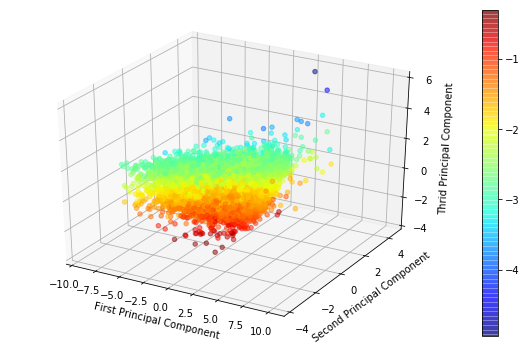

In [48]:
plot_3d(pca_std, data_cl_no_outl, colname="Color")

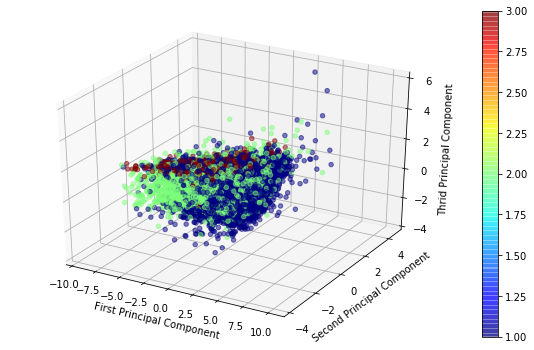

In [49]:
plot_3d(pca_std, data_cl_no_outl, colname="type_n")

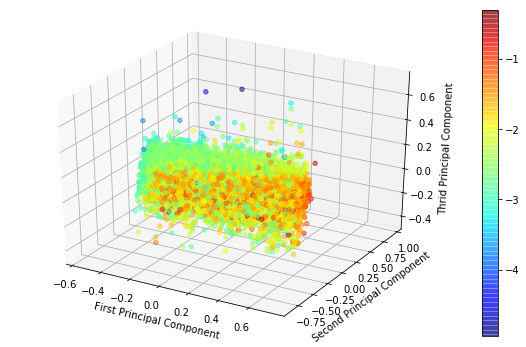

In [50]:
plot_3d(pca_minmax, data_cl_no_outl, colname="Color")

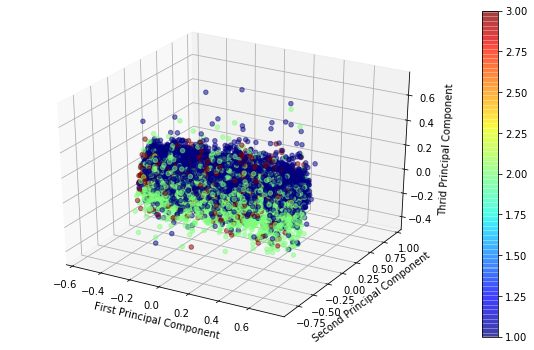

In [51]:
plot_3d(pca_minmax, data_cl_no_outl, colname="type_n")

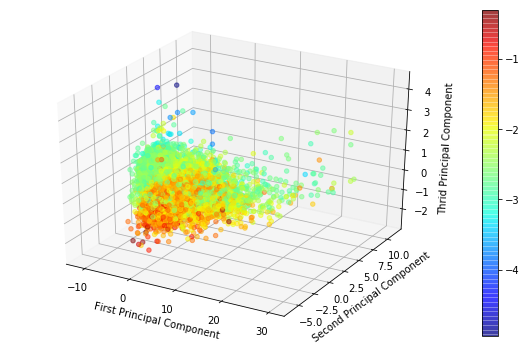

In [52]:
plot_3d(pca_no_scaler, data_cl_no_outl, colname="Color")

## Con las columnas de morfologia

Ahora ejecutamos PCA utilizando tambien las columnas que nos dicen la morfología de la galaxia

In [53]:
#drop_cols = ["ra", "dec", "type","type_n"]
drop_cols = ["type","type_n"]
pca_std3 = std_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_minmax3 = minmax_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))
pca_no_scaler3 = no_scaler_pipe.fit_transform(data_cl_no_outl.drop(drop_cols, axis=1))

print("Explained Variance")
print("With MinMaxScaler: ", minmax_pipe.named_steps["pca"].explained_variance_ratio_, sum(minmax_pipe.named_steps["pca"].explained_variance_ratio_))
print("With StandardScaler: ", std_pipe.named_steps["pca"].explained_variance_ratio_, sum(std_pipe.named_steps["pca"].explained_variance_ratio_))
print("Without Scaler: ", no_scaler_pipe.named_steps["pca"].explained_variance_ratio_, sum(no_scaler_pipe.named_steps["pca"].explained_variance_ratio_))

/opt/conda/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/opt/conda/lib/python3.7/site-packages/sklearn/preprocessing/data.py:334: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


Explained Variance
With MinMaxScaler:  [0.58164254 0.14210997 0.108664  ] 0.8324165063535361
With StandardScaler:  [0.44963849 0.13047077 0.10849376] 0.6886030250965193
Without Scaler:  [0.89891862 0.09363126 0.00647382] 0.9990236972912893


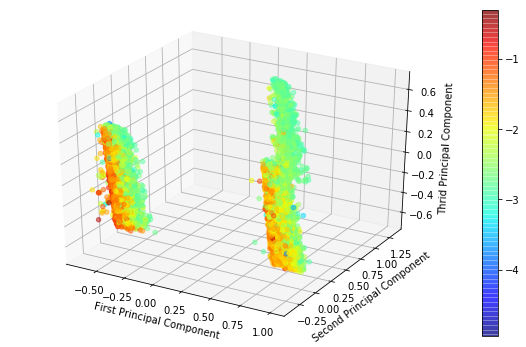

In [54]:
plot_3d(pca_minmax3, data_cl_no_outl, colname="Color")

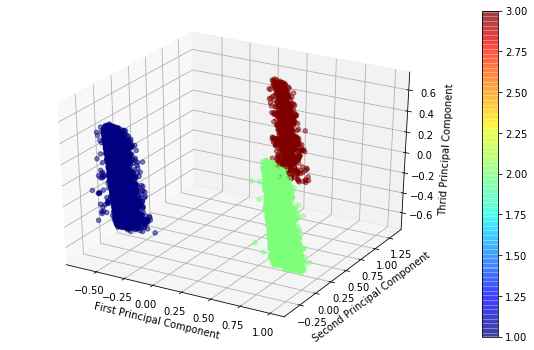

In [55]:
plot_3d(pca_minmax3, data_cl_no_outl, colname="type_n")

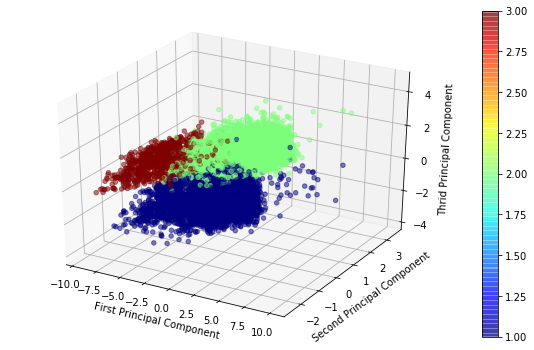

In [56]:
plot_3d(pca_std3, data_cl_no_outl, colname="type_n")

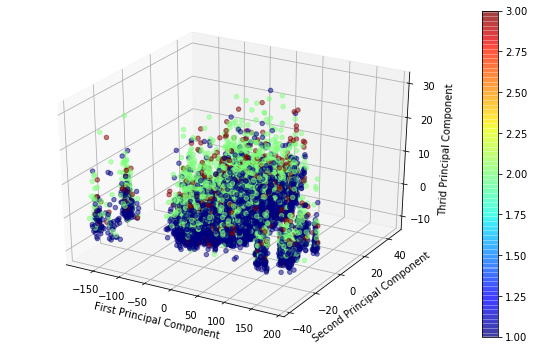

In [57]:
plot_3d(pca_no_scaler3, data_cl_no_outl, colname="type_n")

## Graficos 3D Interactivos

In [58]:
from plotly.offline import plot, init_notebook_mode, iplot
from plotly.graph_objs import *
import numpy as np
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()
# x = np.random.randn(2000)
# y = np.random.randn(2000)

# Instead of simply calling plot(...), store your plot as a variable and pass it to displayHTML().
# Make sure to specify output_type='div' as a keyword argument.
# (Note that if you call displayHTML() multiple times in the same cell, only the last will take effect.)

p = iplot([
    Scatter3d(x=pca_std3[0:10000,0], y=pca_std3[0:10000,1], z=pca_std3[0:10000,2],
              mode='markers',
              marker=dict(color=data_cl_no_outl.reset_index().loc[0:10000, 'type_n'],
                          showscale=True,
                          colorscale='Bluered',
                          size=3
                          #cmap=plt.get_cmap("jet")
                         ))
  ],)


In [59]:
p = iplot([
    Scatter3d(x=pca_minmax3[0:10000,0], y=pca_minmax3[0:10000,1], z=pca_minmax3[0:10000,2],
              mode='markers',
              marker=dict(color=data_cl_no_outl.reset_index().loc[0:10000, 'type_n'],
                          showscale=True,
                          colorscale='Bluered',
                          size=3
                          #cmap=plt.get_cmap("jet")
                         ))
  ],)


Podemos ver que al dejar las columnas de tipo, los datos quedan separados en 3 grupos bien distinctivos identificados por la morfología de la clase y lo podemos gráficar en un plot 3D.

Veamos que pasa cuando tratamos de ver el color

In [60]:
p = iplot([
    Scatter3d(x=pca_minmax3[0:10000,0], y=pca_minmax3[0:10000,1], z=pca_minmax3[0:10000,2],
              mode='markers',
              marker=dict(color=data_cl_no_outl.reset_index().loc[0:10000, 'Color'],
                          showscale=True,
                          colorscale='Bluered',
                          size=3
                          #cmap=plt.get_cmap("jet")
                         ))
  ],)

In [61]:
def define_color_label(row):
    if row["Color"] <-2.1:
        return 0 # means red
    else:
        return 1 # means blue

In [62]:
data_cl_no_outl["Color_label"] = data_cl_no_outl.apply(define_color_label, axis=1)

In [63]:
p = iplot([
    Scatter3d(x=pca_minmax3[0:10000,0], y=pca_minmax3[0:10000,1], z=pca_minmax3[0:10000,2],
              mode='markers',
              marker=dict(color=data_cl_no_outl.reset_index().loc[0:10000, 'Color_label'],
                          showscale=True,
                          colorscale='Bluered',
                          size=3
                          #cmap=plt.get_cmap("jet")
                         ))
  ],)

Vemos como el grafico tambien explica los cambios de color dentro de los grupos de morfologia de galaxias. Tanto si lo hacemos con la variable de color continua, como con la de clasificación que creamos.

Es interesante ver como en un solo gráfico tenemos toda esta información 

# Clustering

Aplico modelos de clustering en el dataset, sin usar las columnas relacionadas a la morfologia de la galaxia para ver si alguno de los algoritmos puede encontrar patrones.

In [64]:
from sklearn.cluster import KMeans
from astropy.io import ascii
from astropy.coordinates import SkyCoord
from astropy import units

In [65]:
def cluster_plotter(df, n_clusters):
           
    kmean = KMeans(n_clusters=n_clusters)
    data_to_cluster = df[['ra', 'dec']]
    cat_pred = kmean.fit_predict(data_to_cluster)
    
    fig = plt.figure(figsize=(18, 14))
    fig.add_subplot(111, projection='aitoff')
    plt.grid(True)
    coords_gx = SkyCoord(data_to_cluster.ra, data_to_cluster.dec, unit='degree')
    ra_gx = coords_gx.ra.wrap_at(180*  units.deg).radian
    dec_gx = coords_gx.dec.radian
    plt.scatter(ra_gx,dec_gx, c=cat_pred, marker='.',s=0.01, cmap='viridis')
    

Si realizamos el clusterizado en un principio con los datos crudos (tanto con outliers y con duplicados) y tomando 30 clusters observamos algunos clusters bastante evidentes a simple vista.

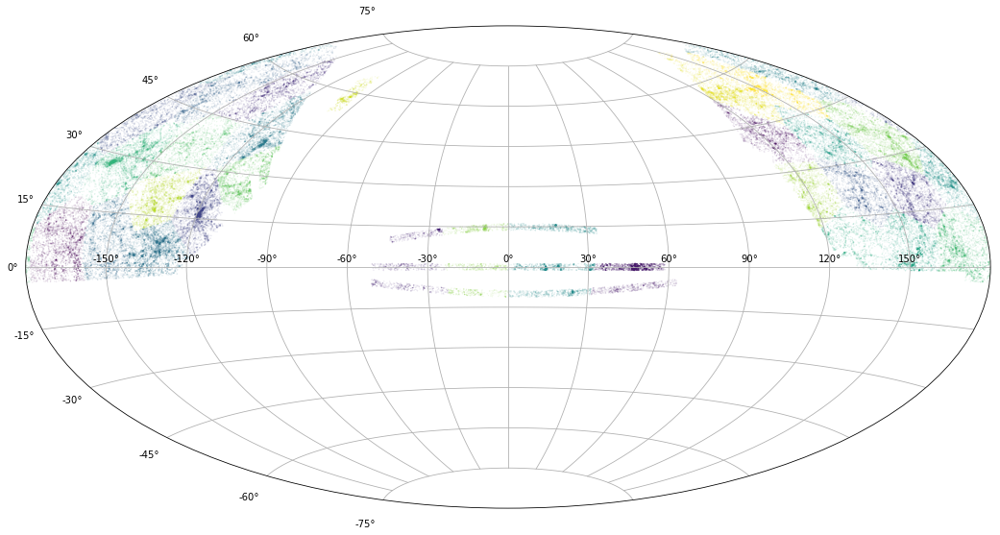

In [66]:
cluster_plotter(data, 30)

Tratamos con mas clusters:

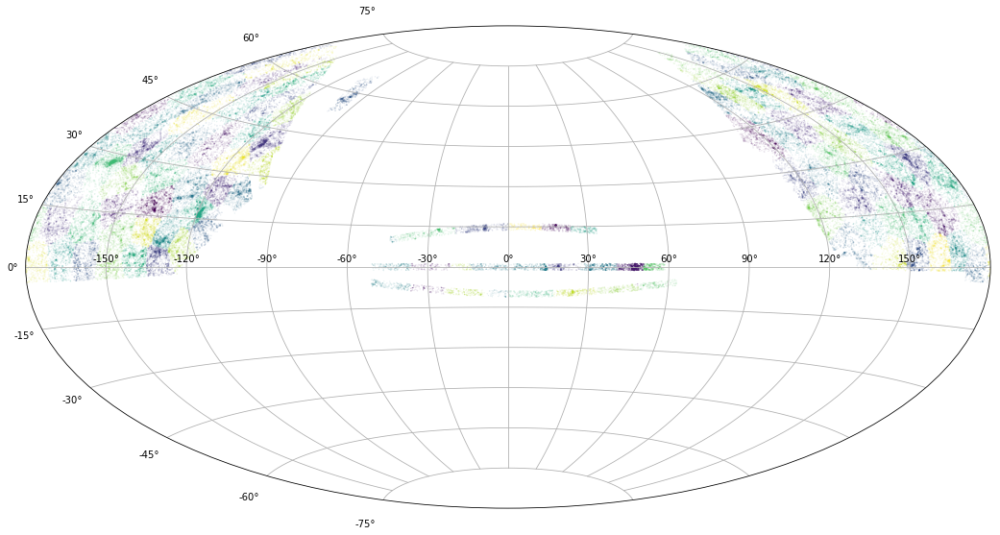

In [67]:
cluster_plotter(data, 100)

Si realizamos el mismo plot con los datos sin los datos duplicados pero con los outliers podemos inferir que una  parte de los clusters que observamos se deben a los datos duplicados.

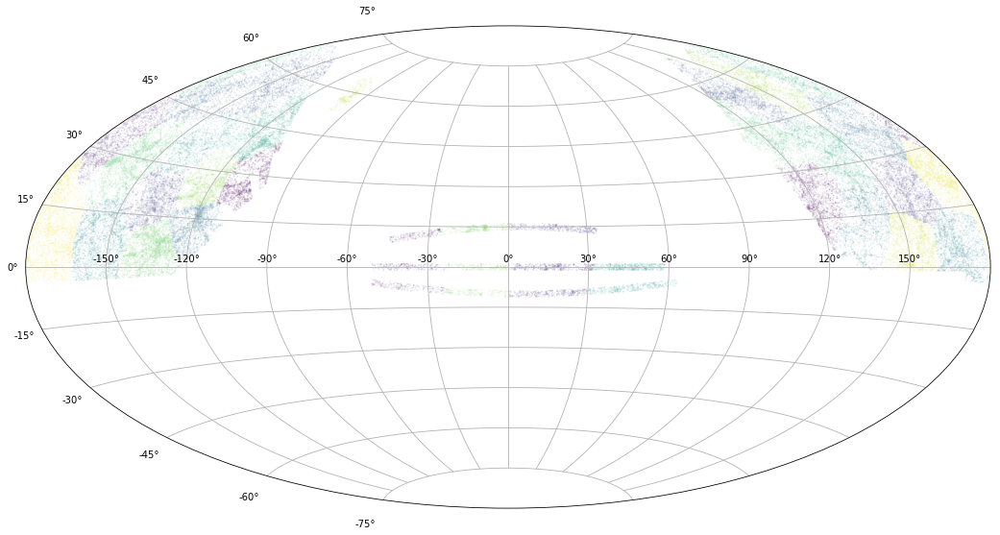

In [68]:
cluster_plotter(data_cl,30)

Tomamos ahora los datos sin duplicados y sin outliers.

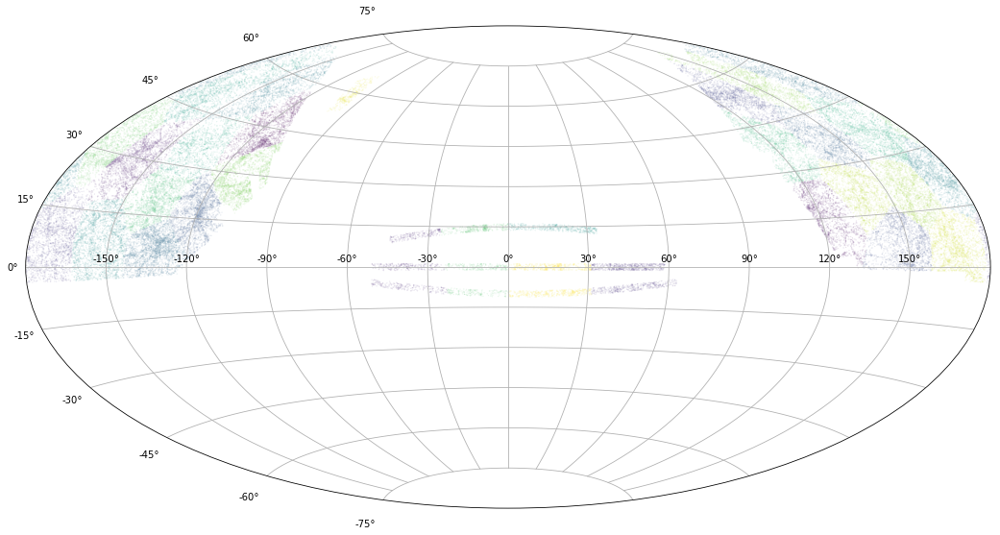

In [69]:
cluster_plotter(data_cl_no_outl, 30)

Tratamos un clusterizado de mayor cantidad.

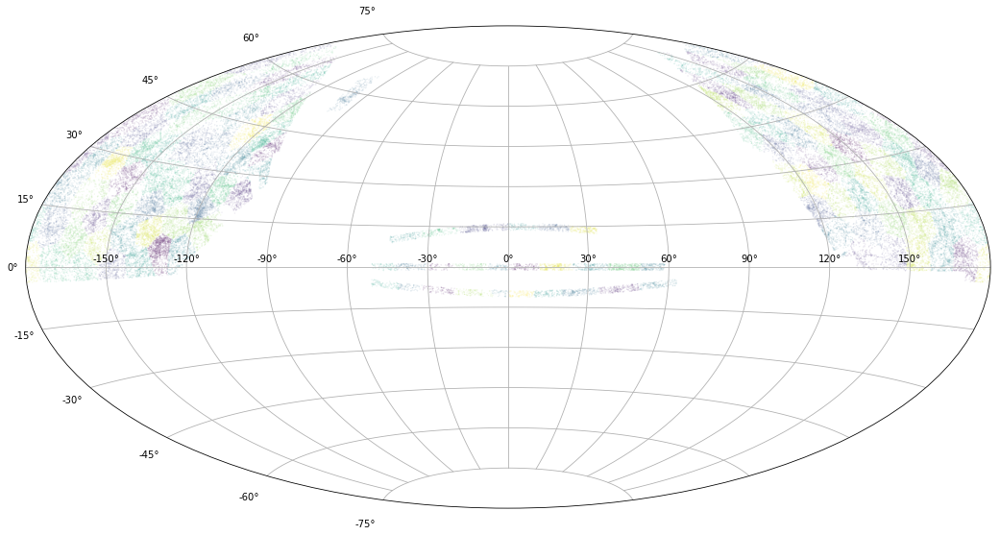

In [70]:
cluster_plotter(data_cl_no_outl, 120)

Notemos que en este caso los cumulos desaparecen casi por completo y vemos una estructura bastante uniforme. Tal vez es un buen momento para consultar al experto de dominio que cantidad de clusters se buscan.

# Docker

- Declare las versiones exactas de los sofwares usados. 
- Comparta una imagen para poder correr esta notebook.